In [3]:
%load_ext autoreload
%autoreload 2

import torch
from epsilon_transformers.analysis.load_data import S3ModelLoader
from epsilon_transformers.analysis.activation_analysis import prepare_msp_data
from scripts.activation_analysis.data_loading import ActivationExtractor
from scripts.activation_analysis.config import TRANSFORMER_ACTIVATION_KEYS
from scripts.activation_analysis.config import RCOND_SWEEP_LIST
from typing import Optional, List, Dict, Tuple
import numpy as np # Make sure numpy is imported
import os # Make sure os is imported


2025-04-29 14:01:12,080 - root - INFO - Logging session started. Log file: logs/analysis_20250429_140112.log


In [4]:
def _combine_layer_activations(nn_acts):
    """Combine activations from all layers into a single tensor, by concatenating them
    make sure to reshape back to the original shape
    a single act is of shape (n_samples, n_ctx, d_model)
    so in the end the shape should be (n_samples, n_ctx, d_model*n_layers)"""
    flattened_acts = []
    first_layer_key = list(nn_acts.keys())[0]
    n_samples = nn_acts[first_layer_key].shape[0]
    n_ctx = nn_acts[first_layer_key].shape[1]
    
    all_acts = []
    for layer_act in nn_acts.values():
        # Reshape to (n_samples, -1) to flatten any extra dimensions
        all_acts.append(layer_act)

    cat = torch.cat(all_acts, dim=2) 
    #print(cat.shape)
    return cat



def find_duplicate_prefixes(nn_inputs):
    """
    Find duplicate prefixes in the input sequences and return their indices.
    
    Args:
        nn_inputs: Tensor of shape (batch_size, seq_len) containing token sequences
        
    Returns:
        Dictionary mapping each unique prefix tuple to a list of (seq_idx, pos) tuples
    """
    batch_size, seq_len = nn_inputs.shape
    prefix_to_indices = {}  # (prefix tuple) -> list of (seq_idx, pos) tuples
    
    # Process each sequence and position
    for seq_idx in range(batch_size):
        seq = nn_inputs[seq_idx]
        
        for pos in range(seq_len):
            # Get the prefix up to this position
            prefix = tuple(seq[:pos+1].cpu().numpy().tolist())
            
            # Add this occurrence to our mapping
            if prefix not in prefix_to_indices:
                prefix_to_indices[prefix] = []
            prefix_to_indices[prefix].append((seq_idx, pos))
    
    return prefix_to_indices

def combine_duplicate_data(prefix_to_indices, activations, nn_probs, belief_states, debug=False, tolerance=1e-6):
    """
    Combine data for duplicate prefixes by summing probabilities.
    
    Args:
        prefix_to_indices: Dictionary mapping prefixes to lists of (seq_idx, pos) tuples
        activations: Tensor of shape (batch_size, seq_len, d_model)
        nn_probs: Tensor of shape (batch_size, seq_len)
        belief_states: Tensor of shape (batch_size, seq_len, belief_dim)
        debug: Whether to print debug information
        tolerance: Tolerance for activation differences
        
    Returns:
        Tuple of (unique_activations, summed_probs, unique_beliefs, unique_prefixes)
    """
    # Dictionary to store unique activations and summed probabilities
    unique_data = {}  # (prefix tuple) -> (activation, summed_prob, belief_state, count)
    
    # Debug information
    if debug:
        activation_diffs = {}  # (prefix tuple) -> max difference observed
        inconsistent_prefixes = []
    
    # Process each unique prefix
    for prefix, indices_list in prefix_to_indices.items():
        first_seq_idx, first_pos = indices_list[0]
        act = activations[first_seq_idx, first_pos]
        prob = nn_probs[first_seq_idx, first_pos]
        belief = belief_states[first_seq_idx, first_pos]
        count = 1
        
        # Process additional occurrences of this prefix
        for seq_idx, pos in indices_list[1:]:
            current_act = activations[seq_idx, pos]
            current_prob = nn_probs[seq_idx, pos]
            
            if debug:
                # Check if activations are the same
                diff = torch.max(torch.abs(act - current_act)).item()
                
                if diff > tolerance:
                    if prefix not in inconsistent_prefixes:
                        inconsistent_prefixes.append(prefix)
                    
                    current_max_diff = activation_diffs.get(prefix, 0)
                    activation_diffs[prefix] = max(current_max_diff, diff)
            
            # Sum the probabilities
            prob += current_prob
            count += 1
        
        # Store the combined data
        unique_data[prefix] = (act, prob, belief, count)
    
    # Print debug info if requested
    if debug:
        if inconsistent_prefixes:
            print(f"WARNING: Found {len(inconsistent_prefixes)} prefixes with inconsistent activations!")
            print(f"Max differences observed:")
            for prefix in sorted(inconsistent_prefixes, key=lambda p: activation_diffs[p], reverse=True)[:10]:
                print(f"  Prefix {prefix}: max diff = {activation_diffs[prefix]}, seen {unique_data[prefix][3]} times")
        else:
            print("All prefixes have consistent activations (within tolerance).")
            
        total_saved = sum(unique_data[p][3] - 1 for p in unique_data)
        total_items = sum(len(indices) for indices in prefix_to_indices.values())
        print(f"Deduplication saved {total_saved} activations out of {total_items}")
    
    # Convert to tensors
    unique_prefixes = list(unique_data.keys())
    unique_activations = torch.stack([unique_data[p][0] for p in unique_prefixes])
    summed_probs = torch.tensor([unique_data[p][1] for p in unique_prefixes])
    unique_beliefs = torch.stack([unique_data[p][2] for p in unique_prefixes])
    
    return unique_activations, summed_probs, unique_beliefs, unique_prefixes

def deduplicate_tensor(prefix_to_indices, tensor, aggregation_fn=None, debug=False, tolerance=1e-6):
    """
    Deduplicate a single tensor based on prefix indices.
    
    Args:
        prefix_to_indices: Dictionary mapping prefixes to lists of (seq_idx, pos) tuples
        tensor: Tensor of shape (batch_size, seq_len, ...) to deduplicate
        aggregation_fn: Function to aggregate duplicate values (default: take first occurrence)
                        Should accept a list of tensor values and return a single value
        debug: Whether to print debug information
        tolerance: Tolerance for tensor value differences
        
    Returns:
        Tuple of (unique_tensor_values, unique_prefixes)
    """
    # Dictionary to store unique tensor values
    unique_data = {}  # (prefix tuple) -> (tensor_value, count)
    
    # Debug information
    if debug:
        value_diffs = {}  # (prefix tuple) -> max difference observed
        inconsistent_prefixes = []
    
    # Process each unique prefix
    for prefix, indices_list in prefix_to_indices.items():
        first_seq_idx, first_pos = indices_list[0]
        value = tensor[first_seq_idx, first_pos]
        count = 1
        
        # If we have an aggregation function and multiple occurrences, prepare to aggregate
        if aggregation_fn is not None and len(indices_list) > 1:
            values = [value]
            
            # Collect all values for this prefix
            for seq_idx, pos in indices_list[1:]:
                current_value = tensor[seq_idx, pos]
                values.append(current_value)
                
                if debug:
                    # Check if values are the same
                    diff = torch.max(torch.abs(value - current_value)).item()
                    
                    if diff > tolerance:
                        if prefix not in inconsistent_prefixes:
                            inconsistent_prefixes.append(prefix)
                        
                        current_max_diff = value_diffs.get(prefix, 0)
                        value_diffs[prefix] = max(current_max_diff, diff)
                
                count += 1
            
            # Aggregate the values
            value = aggregation_fn(values)
        
        # Store the unique value
        unique_data[prefix] = (value, count)
    
    # Print debug info if requested
    if debug:
        if inconsistent_prefixes:
            print(f"WARNING: Found {len(inconsistent_prefixes)} prefixes with inconsistent values!")
            print(f"Max differences observed:")
            for prefix in sorted(inconsistent_prefixes, key=lambda p: value_diffs[p], reverse=True)[:10]:
                print(f"  Prefix {prefix}: max diff = {value_diffs[prefix]}, seen {unique_data[prefix][1]} times")
        else:
            print("All prefixes have consistent values (within tolerance).")
            
        total_saved = sum(unique_data[p][1] - 1 for p in unique_data)
        total_items = sum(len(indices) for indices in prefix_to_indices.values())
        print(f"Deduplication saved {total_saved} items out of {total_items}")
    
    # Convert to tensor
    unique_prefixes = list(unique_data.keys())
    unique_values = torch.stack([unique_data[p][0] for p in unique_prefixes])
    
    return unique_values, unique_prefixes

def get_nn_type(run_id):
    if 'GRU' in run_id or 'LSTM' in run_id or 'RNN' in run_id or 're' in run_id:
        return "RNN"
    else:
        return "transformer"

In [5]:
from epsilon_transformers.analysis.load_data import S3ModelLoader
s3_loader = S3ModelLoader(use_company_credentials=True)

In [6]:
sweeps = s3_loader.list_sweeps()
print(sweeps)
SWEEP = sweeps[1]
runs = s3_loader.list_runs_in_sweep(SWEEP)
print(runs)
RUN = 'run_21_L4_H4_DH16_DM64_fanizza'
RUN = 'run_16_L4_H4_DH16_DM64_post_quantum'
RUN = 'run_17_L4_H4_DH16_DM64_tom_quantum'
#RUN = 'run_22_L4_H4_DH16_DM64_rrxor'
#RUN = 'run_23_L4_H4_DH16_DM64_mess3'

CHECKPOINT_NUM = -1



['20241121152808', '20241205175736', '20250304052839', '20250304060315', '20250304063704', '20250304070751', '20250304073843', '20250304075926', '20250327113715', '20250327115247', '20250327131902', '20250421221507', '20250422023003']
['run_0_L1_H4_DH16_DM64_post_quantum', 'run_10_L2_H4_DH16_DM64_tom_quantum', 'run_11_L2_H4_DH16_DM64_tom_quantum', 'run_12_L2_H4_DH16_DM64_tom_quantum', 'run_13_L2_H4_DH16_DM64_fanizza', 'run_14_L2_H4_DH16_DM64_rrxor', 'run_15_L2_H4_DH16_DM64_mess3', 'run_16_L4_H4_DH16_DM64_post_quantum', 'run_17_L4_H4_DH16_DM64_tom_quantum', 'run_18_L4_H4_DH16_DM64_tom_quantum', 'run_19_L4_H4_DH16_DM64_tom_quantum', 'run_1_L1_H4_DH16_DM64_tom_quantum', 'run_20_L4_H4_DH16_DM64_tom_quantum', 'run_21_L4_H4_DH16_DM64_fanizza', 'run_22_L4_H4_DH16_DM64_rrxor', 'run_23_L4_H4_DH16_DM64_mess3', 'run_2_L1_H4_DH16_DM64_tom_quantum', 'run_3_L1_H4_DH16_DM64_tom_quantum', 'run_4_L1_H4_DH16_DM64_tom_quantum', 'run_5_L1_H4_DH16_DM64_fanizza', 'run_6_L1_H4_DH16_DM64_rrxor', 'run_7_L1_H4_

In [7]:
import numpy as np
import warnings # To handle potential warnings during PCA

def calculate_weighted_pca_variance(activations: np.ndarray, weights: np.ndarray) -> tuple:
    """
    Performs weighted PCA and calculates explained variance ratios.

    Args:
        activations (np.ndarray): The data array (e.g., deduplicated activations) 
                                  of shape (N, D), where N is number of samples 
                                  and D is number of features.
        weights (np.ndarray): The weights array (e.g., deduplicated probabilities) 
                              of shape (N,). Weights should be non-negative.

    Returns:
        tuple: A tuple containing:
            - cumulative_explained_variance (np.ndarray | None): 
                Array of cumulative explained variance (shape D,). Returns None if PCA fails.
            - explained_variance_ratio (np.ndarray | None): 
                Array of explained variance ratio per component (shape D,). Returns None if PCA fails.
            - sorted_eigenvalues (np.ndarray | None): 
                Array of sorted eigenvalues (shape D,). Returns None if PCA fails.
    """
    if activations.shape[0] != weights.shape[0]:
        raise ValueError(f"Number of samples mismatch: activations ({activations.shape[0]}) vs weights ({weights.shape[0]})")
    if np.any(weights < 0):
        warnings.warn("Input weights contain negative values.", RuntimeWarning)
    if not np.isclose(np.sum(weights), 1.0):
        warnings.warn("Input weights do not sum close to 1. Normalizing weights for PCA.", RuntimeWarning)
        weights = weights / np.sum(weights)
        # Ensure no division by zero if sum was zero
        if np.isnan(weights).any():
             weights = np.ones_like(weights) / weights.shape[0]


    try:
        # 1. Calculate weighted mean
        weighted_mean_acts = np.average(activations, axis=0, weights=weights)
        
        # 2. Center the activation data
        centered_acts = activations - weighted_mean_acts
        
        # 3. Compute the weighted covariance matrix
        # Use bias=True for population estimate, typical for PCA
        # Use ddof=0 explicitly which is equivalent to bias=True for np.cov
        cov_matrix = np.cov(centered_acts, rowvar=False, aweights=weights, ddof=0) 
        
        # 4. Eigen decomposition (use eigh for symmetric matrix)
        eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)
        
        # Check for complex eigenvalues (shouldn't happen for covariance, but safety check)
        if np.iscomplexobj(eigenvalues):
            warnings.warn("Complex eigenvalues encountered. Taking real part.", RuntimeWarning)
            eigenvalues = eigenvalues.real
        
        # Check for negative eigenvalues (can happen due to numerical instability)
        if np.any(eigenvalues < -1e-10): # Allow for small negative noise
            negative_count = np.sum(eigenvalues < -1e-10)
            warnings.warn(f"{negative_count} negative eigenvalues encountered. Setting them to zero.", RuntimeWarning)
            eigenvalues[eigenvalues < 0] = 0

        # 5. Sort eigenvalues and eigenvectors in descending order
        sorted_indices = np.argsort(eigenvalues)[::-1]
        sorted_eigenvalues = eigenvalues[sorted_indices]
        # sorted_eigenvectors = eigenvectors[:, sorted_indices] # Eigenvectors not always needed
        
        # 6. Calculate explained variance ratio
        total_variance = np.sum(sorted_eigenvalues)
        
        if total_variance <= 1e-10: # Handle case of zero variance
             warnings.warn("Total variance is close to zero. Explained variance cannot be computed.", RuntimeWarning)
             explained_variance_ratio = np.zeros_like(sorted_eigenvalues)
             cumulative_explained_variance = np.zeros_like(sorted_eigenvalues)
        else:
            explained_variance_ratio = sorted_eigenvalues / total_variance
            # 7. Calculate cumulative explained variance
            cumulative_explained_variance = np.cumsum(explained_variance_ratio)

        return cumulative_explained_variance, explained_variance_ratio, sorted_eigenvalues

    except np.linalg.LinAlgError as e:
        warnings.warn(f"Weighted PCA failed due to LinAlgError: {e}. Returning None.", RuntimeWarning)
        return None, None, None
    except Exception as e:
         warnings.warn(f"Unexpected error during weighted PCA: {e}. Returning None.", RuntimeWarning)
         return None, None, None
    
import collections # Or 'from collections import defaultdict' if not already done

def nested_dict_factory():
    """Returns a defaultdict that defaults to a regular dictionary."""
    return collections.defaultdict(dict)

In [24]:
from tqdm.auto import tqdm
import joblib
import os
import numpy as np
from collections import defaultdict

output_dir = "run_predictions2" 
output_dir = "run_predictions_cv"
os.makedirs(output_dir, exist_ok=True) # Create the directory if it doesn't exist

sweep_run_pairs = [
    # Mess3
    ("20241121152808", 71),  # RNN
    ("20241121152808", 63),  # GRU
    ("20241121152808", 55),  # LSTM
    ("20241205175736", 23),  # Transformer
    
    # RRXor
    ("20241121152808", 70),  # RNN
    ("20241121152808", 62),  # GRU
    ("20241121152808", 54),  # LSTM
    ("20241205175736", 22),  # Transformer
    
    # Fanizza
    ("20241121152808", 69),  # RNN
    ("20241121152808", 61),  # GRU
    ("20241121152808", 53),  # LSTM
    ("20241205175736", 21),  # Transformer
    
    # Tom Quantum A
    ("20241121152808", 65),  # RNN
    ("20241121152808", 57),  # GRU
    ("20241121152808", 49),  # LSTM
    ("20241205175736", 17),  # Transformer
    
    # Tom Quantum B
    ("20241121152808", 68),  # RNN
    ("20241121152808", 60),  # GRU
    ("20241121152808", 52),  # LSTM
    ("20241205175736", 20),  # Transformer
    
    # Post Quantum
    ("20241121152808", 64),  # RNN
    ("20241121152808", 56),  # GRU
    ("20241121152808", 48),  # LSTM
    ("20241205175736", 16),  # Transformer
]

sweep_run_pairs = [
    # Mess3
    #("20241121152808", 71),  # RNN
    #("20241121152808", 63),  # GRU
    ("20241121152808", 55),  # LSTM
    ("20241205175736", 23),  # Transformer
    
    # RRXor
    #("20241121152808", 70),  # RNN
    #("20241121152808", 62),  # GRU
    #("20241121152808", 54),  # LSTM
    #("20241205175736", 22),  # Transformer
    
    # Fanizza
    #("20241121152808", 69),  # RNN
    #("20241121152808", 61),  # GRU
    ("20241121152808", 53),  # LSTM
    ("20241205175736", 21),  # Transformer
    
    # Tom Quantum A
    #("20241121152808", 65),  # RNN
    #("20241121152808", 57),  # GRU
    ("20241121152808", 49),  # LSTM
    ("20241205175736", 17),  # Transformer
    
    # Tom Quantum B
    #("20241121152808", 68),  # RNN
    #("20241121152808", 60),  # GRU
    #("20241121152808", 52),  # LSTM
    #("20241205175736", 20),  # Transformer
    
    # Post Quantum
    #("20241121152808", 64),  # RNN
    #("20241121152808", 56),  # GRU
    ("20241121152808", 48),  # LSTM
    ("20241205175736", 16),  # Transformer
]

sweep_run_pairs = [
    ("20250304052839", 5),  # Transformer
    ("20250304060315", 5),  # LSTM
]


for sweep, run_id_int in sweep_run_pairs:
    run_dir = f'{output_dir}/{sweep}_{run_id_int}'
    os.makedirs(run_dir, exist_ok=True) # Create the directory if it doesn't exist

    runs = s3_loader.list_runs_in_sweep(sweep)
    # keep the entry of run that has f'run_{run_id_int}' in it
    run_id = [x for x in runs if f'run_{run_id_int}' in x][0]

    print(run_id)
    ckpts = s3_loader.list_checkpoints(sweep, run_id)
    model, run_config = s3_loader.load_checkpoint(sweep, run_id, ckpts[0])


    loss_df = s3_loader.load_loss_from_run(sweep, run_id)
    print(loss_df.keys())
    print(loss_df.epoch)
    print(loss_df.num_tokens_seen)
    n_ctx = run_config["model_config"]["n_ctx"]
    run_config["n_ctx"] = n_ctx
    nn_inputs, nn_beliefs, _, nn_probs, _ = prepare_msp_data(
        run_config, run_config["process_config"]
    )

    prefix_to_indices = find_duplicate_prefixes(nn_inputs)
    dedup_probs, dedup_indices = deduplicate_tensor(prefix_to_indices, nn_probs, aggregation_fn=sum)
    #normalize the probs to sum to 1
    dedup_probs = dedup_probs / dedup_probs.sum()
    dedup_beliefs, dedup_indices = deduplicate_tensor(prefix_to_indices, nn_beliefs, aggregation_fn=None)
    
    print(dedup_indices)
    ground_truth_data = defaultdict(dict) # Keys: ckpt -> layer -> predictions
    ground_truth_data['probs'] = np.array(dedup_probs)
    ground_truth_data['beliefs'] = np.array(dedup_beliefs)
    ground_truth_data['indices'] = np.array(dedup_indices, dtype=object)
    joblib.dump(ground_truth_data, f'{run_dir}/ground_truth_data.joblib')
    
    for epoch, ckpt in enumerate(tqdm(s3_loader.list_checkpoints(sweep, run_id))):
        model, run_config = s3_loader.load_checkpoint(sweep, run_id, ckpt)

        #ckpt_ind is between / and .pt
        ckpt_ind = ckpt.split('/')[-1].split('.')[0]
        # we want the value of 'val_loss_mean' where num_tokens_seen == ckpt_ind
        try:
            filtered_df = loss_df[loss_df['epoch'] == epoch-1]
            if len(filtered_df) > 0 and 'val_loss_mean' in filtered_df.columns:
                val_loss_mean = filtered_df['val_loss_mean'].values[0]
            else:
                val_loss_mean = float('nan')
        except (KeyError, IndexError, AttributeError):
            val_loss_mean = float('nan')
        
        act_extractor = ActivationExtractor(device='cpu')
        nn_acts_ = act_extractor.extract_activations(
            model,
            nn_inputs,
            get_nn_type(run_id),
            relevant_activation_keys=TRANSFORMER_ACTIVATION_KEYS,
        )
            # Run regression on combined layers

        nn_acts = {}
        for layer, acts in nn_acts_.items():
            nn_acts[layer] = acts
        nn_acts['combined'] = _combine_layer_activations(nn_acts)

        save_data = collections.defaultdict(nested_dict_factory) # Use the named function here
        
        for layer, act in nn_acts.items():
            
            # dedup the activations
            dedup_acts, dedup_indices = deduplicate_tensor(prefix_to_indices, act, aggregation_fn=None)  
            
            zscore_acts = (dedup_acts.numpy() - dedup_acts.numpy().mean(axis=0)) / dedup_acts.numpy().std(axis=0)
            cum_var_exp, _, _ = calculate_weighted_pca_variance(dedup_acts.numpy(), dedup_probs.numpy())
            cum_var_exp_zscore, _, _ = calculate_weighted_pca_variance(zscore_acts, dedup_probs.numpy())
   
            # do linear regression to predict the dedup beliefs from the dedup activations
            from sklearn.linear_model import RidgeCV
            # Use RidgeCV with 100 alphas for regularization
            alphas = np.logspace(-3, 3, 100)
            reg = RidgeCV(alphas=alphas).fit(dedup_acts.numpy(), dedup_beliefs.numpy(), sample_weight=dedup_probs.numpy())
            predicted_beliefs = reg.predict(dedup_acts.numpy())

            # record measures of error, like rmse, mae, r2, etc.
            # use probs as weights for the error metrics
            weights = dedup_probs.numpy()
            rmse = np.sqrt(np.average((predicted_beliefs - dedup_beliefs.numpy())**2, weights=weights, axis=0))
            mae = np.average(np.abs(predicted_beliefs - dedup_beliefs.numpy()), weights=weights, axis=0)
            mse = np.average((predicted_beliefs - dedup_beliefs.numpy())**2, weights=weights, axis=0)
            
            # weighted r2 calculation
            y_true = dedup_beliefs.numpy()
            y_pred = predicted_beliefs
            weighted_mean = np.average(y_true, weights=weights, axis=0)
            
            # Fix broadcasting issue by reshaping weights to match dimensions
            weights_reshaped = weights.reshape(-1, 1)  # reshape to (9840, 1) to broadcast with (9840, 3)
            total_ss = np.sum(weights_reshaped * (y_true - weighted_mean)**2, axis=0)
            residual_ss = np.sum(weights_reshaped * (y_true - y_pred)**2, axis=0)
            r2 = 1 - (residual_ss / total_ss)
            
            # Calculate Euclidean distance weighted by probabilities
            dist = np.average(np.linalg.norm(predicted_beliefs - dedup_beliefs.numpy(), axis=1), weights=weights)
            save_data[layer]['predicted_beliefs'] = predicted_beliefs
            save_data[layer]['rmse'] = rmse
            save_data[layer]['mae'] = mae
            save_data[layer]['r2'] = r2
            save_data[layer]['dist'] = dist
            save_data[layer]['mse'] = mse
            save_data[layer]['cum_var_exp'] = cum_var_exp
            save_data[layer]['cum_var_exp_zscore'] = cum_var_exp_zscore
            save_data[layer]['val_loss_mean'] = val_loss_mean
        
        # Save each checkpoint's data to a separate file
        joblib.dump(save_data, f'{run_dir}/checkpoint_{ckpt_ind}.joblib')


run_5_L4_H8_DH8_DM64_fanizza
Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse from file
Index(['epoch', 'num_tokens_seen', 'train_loss_ctx0', 'val_loss_ctx0',
       'train_loss_ctx1', 'val_loss_ctx1', 'train_loss_ctx2', 'val_loss_ctx2',
       'train_loss_ctx3', 'val_loss_ctx3', 'train_loss_ctx4', 'val_loss_ctx4',
       'train_loss_ctx5', 'val_loss_ctx5', 'train_loss_ctx6', 'val_loss_ctx6',
       'train_loss_ctx7', 'val_loss_ctx7', 'train_loss_mean', 'val_loss_mean',
       'learning_rate'],
      dtype='object')
0     -1
1      0
2      1
3      2
4      3
5      4
6      5
7      6
8      7
9      8
10     9
11    10
12    11
13    12
14    13
15    14
16    15
17    16
18    17
19    18
20    19
21    20
22    21
23    22
24    23
25    24
26    25
27    26
28    27
29    28
30    29
31    30
32    31
Name: epoch, dtype: int64
0          0
1      25600
2      51200
3      76800
4     102400
5     128000
6     153600
7     179200
8   

  0%|          | 0/151 [00:00<?, ?it/s]

Error loading log.csv: No columns to parse from file
1.4263388365507126
1.4263388365507126
1.4263388365507126
1.4263388365507126
1.4263388365507126
1.4263388365507126
1.4263388365507126
Error loading log.csv: No columns to parse from file
1.039473682641983
1.039473682641983
1.039473682641983
1.039473682641983
1.039473682641983
1.039473682641983
1.039473682641983
Error loading log.csv: No columns to parse from file
1.0313827991485596
1.0313827991485596
1.0313827991485596
1.0313827991485596
1.0313827991485596
1.0313827991485596
1.0313827991485596
Error loading log.csv: No columns to parse from file
1.0305224061012268
1.0305224061012268
1.0305224061012268
1.0305224061012268
1.0305224061012268
1.0305224061012268
1.0305224061012268
Error loading log.csv: No columns to parse from file
1.0279179215431211
1.0279179215431211
1.0279179215431211
1.0279179215431211
1.0279179215431211
1.0279179215431211
1.0279179215431211
Error loading log.csv: No columns to parse from file
1.0230505615472794
1.023

  0%|          | 0/151 [00:00<?, ?it/s]

1.059379130601883
1.059379130601883
1.059379130601883
1.059379130601883
1.059379130601883
1.059379130601883
1.0570227056741714
1.0570227056741714
1.0570227056741714
1.0570227056741714
1.0570227056741714
1.0570227056741714
1.0325435101985931
1.0325435101985931
1.0325435101985931
1.0325435101985931
1.0325435101985931
1.0325435101985931
1.008104369044304
1.008104369044304
1.008104369044304
1.008104369044304
1.008104369044304
1.008104369044304
1.0023337006568909
1.0023337006568909
1.0023337006568909
1.0023337006568909
1.0023337006568909
1.0023337006568909
1.0020239055156708
1.0020239055156708
1.0020239055156708
1.0020239055156708
1.0020239055156708
1.0020239055156708
1.0029114186763763
1.0029114186763763
1.0029114186763763
1.0029114186763763
1.0029114186763763
1.0029114186763763
1.0018942058086395
1.0018942058086395
1.0018942058086395
1.0018942058086395
1.0018942058086395
1.0018942058086395
1.001266673207283
1.001266673207283
1.001266673207283
1.001266673207283
1.001266673207283
1.00126667

In [23]:
loss_df

,epoch,num_tokens_seen,train_loss_ctx0,val_loss_ctx0,train_loss_ctx1,val_loss_ctx1,train_loss_ctx2,val_loss_ctx2,train_loss_ctx3,val_loss_ctx3,...,val_loss_ctx4,train_loss_ctx5,val_loss_ctx5,train_loss_ctx6,val_loss_ctx6,train_loss_ctx7,val_loss_ctx7,train_loss_mean,val_loss_mean,learning_rate
0,-1,0,NaN,1.353989,NaN,1.435563,NaN,1.387590,NaN,1.394154,...,1.564286,NaN,1.348287,NaN,1.594889,NaN,1.331953,NaN,1.426339,0.001
1,0,25600,1.044972,1.003162,1.046343,1.006020,1.081075,1.033107,1.115443,1.057849,...,1.048989,1.102294,1.058333,1.101276,1.055537,1.118554,1.052793,1.090679,1.039474,0.001
2,1,51200,1.003612,1.003396,0.996359,1.001732,1.031074,1.023396,1.036230,1.041105,...,1.041047,1.044889,1.045967,1.057359,1.046828,1.045040,1.047592,1.033367,1.031383,0.001
3,2,76800,1.000594,1.005333,0.998386,1.003534,1.030159,1.021291,1.042150,1.041962,...,1.036073,1.035690,1.045374,1.053442,1.045418,1.049605,1.045194,1.031968,1.030522,0.001
4,3,102400,1.000513,1.003366,1.007872,1.002888,1.023629,1.017149,1.040486,1.036479,...,1.030558,1.047218,1.045425,1.051803,1.043896,1.050018,1.043583,1.032267,1.027918,0.001
5,4,128000,0.995007,1.001319,1.000216,1.001535,1.007738,1.007919,1.023560,1.027502,...,1.031357,1.033423,1.039646,1.041254,1.039002,1.030602,1.036123,1.020643,1.023051,0.001
6,5,153600,1.002817,1.001371,1.006407,1.002139,1.000825,1.007172,1.018825,1.019647,...,1.027146,1.041092,1.029230,1.024602,1.031316,1.036075,1.032022,1.018518,1.018755,0.001
7,6,179200,1.011556,1.004560,1.007767,1.004096,1.007617,1.004611,1.002894,1.014789,...,1.017012,1.024918,1.021316,1.030787,1.021379,1.025020,1.026941,1.017067,1.014338,0.001
8,7,204800,1.002931,1.010361,0.999711,1.014983,1.009544,1.003316,1.005581,1.009335,...,1.003578,1.011528,1.007234,1.023140,1.014145,1.018267,1.021011,1.011611,1.010495,0.001
9,8,230400,1.007532,1.000876,1.006720,1.002815,1.009687,1.001827,1.000372,1.001907,...,1.015652,1.005207,1.007001,1.013632,1.022087,1.022440,1.016583,1.008231,1.008594,0.001


In [3]:
from scripts.activation_analysis.data_loading import ModelDataManager
from scripts.activation_analysis.belief_states import BeliefStateGenerator
model_data_manager = ModelDataManager(device='cpu', use_company_s3=True)
belief_generator = BeliefStateGenerator(model_data_manager, device='cpu')
s3_loader = S3ModelLoader(model_data_manager)
SWEEP = "20241121152808"
runs = s3_loader.list_runs_in_sweep(SWEEP)
RUN = runs[1]
print(RUN)
CHECKPOINT = s3_loader.list_checkpoints(SWEEP, RUN)[0]
model, run_config = s3_loader.load_checkpoint(SWEEP, RUN, CHECKPOINT)
MAX_MARKOV_ORDER = 3
classical_beliefs = belief_generator.generate_classical_belief_states(
    run_config, max_order=MAX_MARKOV_ORDER
)

run_10_L1_H64_GRU_uni_tom_quantum
Computing MSP data...


In [26]:
from tqdm.auto import tqdm
import joblib
import os
import numpy as np
from collections import defaultdict
import collections
import glob
import shutil

from scripts.activation_analysis.data_loading import ModelDataManager
from scripts.activation_analysis.belief_states import BeliefStateGenerator
model_data_manager = ModelDataManager(device='cpu', use_company_s3=True)
belief_generator = BeliefStateGenerator(model_data_manager, device='cpu')

output_dir = "run_predictions_cv" 
os.makedirs(output_dir, exist_ok=True) # Create the directory if it doesn't exist

sweep_run_pairs = [
    # Mess3
    #("20241121152808", 71),  # RNN
    #("20241121152808", 63),  # GRU
    ("20241121152808", 55),  # LSTM
    ("20241205175736", 23),  # Transformer
    
    # RRXor
    #("20241121152808", 70),  # RNN
    #("20241121152808", 62),  # GRU
    #("20241121152808", 54),  # LSTM
    #("20241205175736", 22),  # Transformer
    
    # Fanizza
    #("20241121152808", 69),  # RNN
    #("20241121152808", 61),  # GRU
    ("20241121152808", 53),  # LSTM
    ("20241205175736", 21),  # Transformer
    
    # Tom Quantum A
    #("20241121152808", 65),  # RNN
    #("20241121152808", 57),  # GRU
    ("20241121152808", 49),  # LSTM
    ("20241205175736", 17),  # Transformer
    
    # Tom Quantum B
    #("20241121152808", 68),  # RNN
    #("20241121152808", 60),  # GRU
    #("20241121152808", 52),  # LSTM
    #("20241205175736", 20),  # Transformer
    
    # Post Quantum
    #("20241121152808", 64),  # RNN
    #("20241121152808", 56),  # GRU
    ("20241121152808", 48),  # LSTM
    ("20241205175736", 16),  # Transformer
]

sweep_run_pairs = [
    ("20250304052839", 5),  # Transformer
    ("20250304060315", 5),  # LSTM
]


for sweep, run_id_int in sweep_run_pairs:
    run_dir = f'{output_dir}/{sweep}_{run_id_int}'
    os.makedirs(run_dir, exist_ok=True) # Create the directory if it doesn't exist
    
    # Check if data already exists for this run
    ground_truth_file = f'{run_dir}/markov3_ground_truth_data.joblib'
    #if os.path.exists(ground_truth_file):
    #    print(f"Ground truth data already exists for {sweep}_{run_id_int}, skipping...")
    #    continue
        
    runs = s3_loader.list_runs_in_sweep(sweep)
    # keep the entry of run that has f'run_{run_id_int}' in it
    run_id = [x for x in runs if f'run_{run_id_int}' in x][0]

    print(run_id)
    ckpts = s3_loader.list_checkpoints(sweep, run_id)
    model, run_config = s3_loader.load_checkpoint(sweep, run_id, ckpts[0])


    loss_df = s3_loader.load_loss_from_run(sweep, run_id)
    print(loss_df.keys())
    n_ctx = run_config["model_config"]["n_ctx"]
    run_config["n_ctx"] = n_ctx

    classical_beliefs = belief_generator.generate_classical_belief_states(
    run_config, max_order=3)

    nn_inputs = classical_beliefs['markov_order_3']['inputs']
    nn_beliefs = classical_beliefs['markov_order_3']['beliefs']
    nn_probs = classical_beliefs['markov_order_3']['probs']


    prefix_to_indices = find_duplicate_prefixes(nn_inputs)
    dedup_probs, dedup_indices = deduplicate_tensor(prefix_to_indices, nn_probs, aggregation_fn=sum)
    #normalize the probs to sum to 1
    dedup_probs = dedup_probs / dedup_probs.sum()
    dedup_beliefs, dedup_indices = deduplicate_tensor(prefix_to_indices, nn_beliefs, aggregation_fn=None)
    
    print(dedup_indices)
    ground_truth_data = defaultdict(dict) # Keys: ckpt -> layer -> predictions
    ground_truth_data['probs'] = np.array(dedup_probs)
    ground_truth_data['beliefs'] = np.array(dedup_beliefs)
    ground_truth_data['indices'] = np.array(dedup_indices, dtype=object)
    joblib.dump(ground_truth_data, ground_truth_file)

    checkpoints = s3_loader.list_checkpoints(sweep, run_id)
    
    for checkpoint_idx, ckpt in enumerate(tqdm(checkpoints)):
        # Check if checkpoint data already exists
        ckpt_ind = ckpt.split('/')[-1].split('.')[0]
        checkpoint_file = f'{run_dir}/markov3_checkpoint_{ckpt_ind}.joblib'
        #if os.path.exists(checkpoint_file):
        #    print(f"Checkpoint {ckpt_ind} data already exists, skipping...")
        #    continue
            
        model, run_config = s3_loader.load_checkpoint(sweep, run_id, ckpt)

        #ckpt_ind is between / and .pt
        # we want the value of 'val_loss_mean' where num_tokens_seen == ckpt_ind
        try:
            matching_rows = loss_df[loss_df['num_tokens_seen'] == int(ckpt_ind)]
            if len(matching_rows) > 0:
                val_loss_mean = matching_rows['val_loss_mean'].values[0]
            else:
                val_loss_mean = float('nan')
        except:
            val_loss_mean = float('nan')
        act_extractor = ActivationExtractor(device='cpu')
        nn_acts_ = act_extractor.extract_activations(
            model,
            nn_inputs,
            get_nn_type(run_id),
            relevant_activation_keys=TRANSFORMER_ACTIVATION_KEYS,
        )
            # Run regression on combined layers

        nn_acts = {}
        for layer, acts in nn_acts_.items():
            nn_acts[layer] = acts
        nn_acts['combined'] = _combine_layer_activations(nn_acts)

        save_data = collections.defaultdict(nested_dict_factory) # Use the named function here
        
        for layer, act in nn_acts.items():
            
            # dedup the activations
            dedup_acts, dedup_indices = deduplicate_tensor(prefix_to_indices, act, aggregation_fn=None)  
            
            zscore_acts = (dedup_acts.numpy() - dedup_acts.numpy().mean(axis=0)) / dedup_acts.numpy().std(axis=0)
            cum_var_exp, _, _ = calculate_weighted_pca_variance(dedup_acts.numpy(), dedup_probs.numpy())
            cum_var_exp_zscore, _, _ = calculate_weighted_pca_variance(zscore_acts, dedup_probs.numpy())
   
            # do linear regression to predict the dedup beliefs from the dedup activations
            from sklearn.linear_model import LinearRegression
            # reg = LinearRegression().fit(dedup_acts.numpy(), dedup_beliefs.numpy(), sample_weight=dedup_probs.numpy())
            from sklearn.linear_model import RidgeCV
            reg = RidgeCV(alphas=np.logspace(-3, 3, 100)).fit(dedup_acts.numpy(), dedup_beliefs.numpy(), sample_weight=dedup_probs.numpy())
            predicted_beliefs = reg.predict(dedup_acts.numpy())

            # record measures of error, like rmse, mae, r2, etc.
            # use probs as weights for the error metrics
            weights = dedup_probs.numpy()
            rmse = np.sqrt(np.average((predicted_beliefs - dedup_beliefs.numpy())**2, weights=weights, axis=0))
            mae = np.average(np.abs(predicted_beliefs - dedup_beliefs.numpy()), weights=weights, axis=0)
            mse = np.average((predicted_beliefs - dedup_beliefs.numpy())**2, weights=weights, axis=0)
            
            # weighted r2 calculation
            y_true = dedup_beliefs.numpy()
            y_pred = predicted_beliefs
            weighted_mean = np.average(y_true, weights=weights, axis=0)
            
            # Fix broadcasting issue by reshaping weights to match dimensions
            weights_reshaped = weights.reshape(-1, 1)  # reshape to (9840, 1) to broadcast with (9840, 3)
            total_ss = np.sum(weights_reshaped * (y_true - weighted_mean)**2, axis=0)
            residual_ss = np.sum(weights_reshaped * (y_true - y_pred)**2, axis=0)
            r2 = 1 - (residual_ss / total_ss)
            
            # Calculate Euclidean distance weighted by probabilities
            dist = np.average(np.linalg.norm(predicted_beliefs - dedup_beliefs.numpy(), axis=1), weights=weights)
            # Only save predicted beliefs for first or last checkpoint to save space
            if checkpoint_idx == 0 or checkpoint_idx == len(checkpoints) - 1:
                save_data[layer]['predicted_beliefs'] = predicted_beliefs
            else:
                save_data[layer]['predicted_beliefs'] = 0
            save_data[layer]['rmse'] = rmse
            save_data[layer]['mae'] = mae
            save_data[layer]['r2'] = r2
            save_data[layer]['dist'] = dist
            save_data[layer]['mse'] = mse
            save_data[layer]['cum_var_exp'] = cum_var_exp
            save_data[layer]['cum_var_exp_zscore'] = cum_var_exp_zscore
            save_data[layer]['val_loss_mean'] = val_loss_mean
        
        # Save each checkpoint's data to a separate file
        joblib.dump(save_data, checkpoint_file)


run_5_L4_H8_DH8_DM64_fanizza
Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse from file
Index(['epoch', 'num_tokens_seen', 'train_loss_ctx0', 'val_loss_ctx0',
       'train_loss_ctx1', 'val_loss_ctx1', 'train_loss_ctx2', 'val_loss_ctx2',
       'train_loss_ctx3', 'val_loss_ctx3', 'train_loss_ctx4', 'val_loss_ctx4',
       'train_loss_ctx5', 'val_loss_ctx5', 'train_loss_ctx6', 'val_loss_ctx6',
       'train_loss_ctx7', 'val_loss_ctx7', 'train_loss_mean', 'val_loss_mean',
       'learning_rate'],
      dtype='object')
Computing MSP data...
[(0,), (0, 0), (0, 0, 0), (0, 0, 0, 0), (0, 0, 0, 0, 0), (0, 0, 0, 0, 0, 0), (0, 0, 0, 0, 0, 0, 0), (0, 0, 0, 0, 0, 0, 0, 0), (0, 0, 0, 0, 0, 0, 0, 1), (0, 0, 0, 0, 0, 0, 1), (0, 0, 0, 0, 0, 0, 1, 0), (0, 0, 0, 0, 0, 0, 1, 1), (0, 0, 0, 0, 0, 1), (0, 0, 0, 0, 0, 1, 0), (0, 0, 0, 0, 0, 1, 0, 0), (0, 0, 0, 0, 0, 1, 0, 1), (0, 0, 0, 0, 0, 1, 1), (0, 0, 0, 0, 0, 1, 1, 0), (0, 0, 0, 0, 0, 1, 1, 1), (0, 0, 0, 0,

  0%|          | 0/151 [00:00<?, ?it/s]

Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse from file
Error loading log.csv: No columns to parse fro

  0%|          | 0/151 [00:00<?, ?it/s]

In [7]:
from tqdm.auto import tqdm
import joblib
import os
import numpy as np
from collections import defaultdict
import collections
import glob  # Added import
import shutil # Added import

from scripts.activation_analysis.data_loading import ModelDataManager
from scripts.activation_analysis.belief_states import BeliefStateGenerator
model_data_manager = ModelDataManager(device='cpu', use_company_s3=True)
belief_generator = BeliefStateGenerator(model_data_manager, device='cpu')

output_dir = "run_predictions" 
os.makedirs(output_dir, exist_ok=True) # Create the directory if it doesn't exist

sweep_run_pairs = [

    #("20241121152808", 49),  # LSTM
    ("20241205175736", 17),  # Transformer
    
]

for sweep, run_id_int in sweep_run_pairs:
    run_dir = f'{output_dir}/{sweep}_{run_id_int}'
    os.makedirs(run_dir, exist_ok=True) # Create the directory if it doesn't exist

    runs = s3_loader.list_runs_in_sweep(sweep)
    # keep the entry of run that has f'run_{run_id_int}' in it
    run_id = [x for x in runs if f'run_{run_id_int}' in x][0]

    print(run_id)
    ckpts = s3_loader.list_checkpoints(sweep, run_id)
    model, run_config = s3_loader.load_checkpoint(sweep, run_id, ckpts[0])


    loss_df = s3_loader.load_loss_from_run(sweep, run_id)
    print(loss_df.keys())
    n_ctx = run_config["model_config"]["n_ctx"]
    run_config["n_ctx"] = n_ctx

    classical_beliefs = belief_generator.generate_classical_belief_states(
    run_config, max_order=3)

    nn_inputs = classical_beliefs['markov_order_3']['inputs']
    nn_beliefs = classical_beliefs['markov_order_3']['beliefs']
    nn_probs = classical_beliefs['markov_order_3']['probs']


    prefix_to_indices = find_duplicate_prefixes(nn_inputs)
    dedup_probs, dedup_indices = deduplicate_tensor(prefix_to_indices, nn_probs, aggregation_fn=sum)
    #normalize the probs to sum to 1
    dedup_probs = dedup_probs / dedup_probs.sum()
    dedup_beliefs, dedup_indices = deduplicate_tensor(prefix_to_indices, nn_beliefs, aggregation_fn=None)
    
    print(dedup_indices)
    ground_truth_data = defaultdict(dict) # Keys: ckpt -> layer -> predictions
    ground_truth_data['probs'] = np.array(dedup_probs)
    ground_truth_data['beliefs'] = np.array(dedup_beliefs)
    ground_truth_data['indices'] = np.array(dedup_indices, dtype=object)
    joblib.dump(ground_truth_data, f'{run_dir}/markov3_ground_truth_data.joblib')
    
    # --- Modification Start ---
    # Define and create a temporary directory for intermediate checkpoint results
    temp_ckpt_dir = f'{run_dir}/temp_checkpoints'
    os.makedirs(temp_ckpt_dir, exist_ok=True) 
    # We will aggregate results after the loop, so no need to initialize final save_data here yet
    # --- Modification End ---

    for ckpt in tqdm(s3_loader.list_checkpoints(sweep, run_id)):
        model, run_config = s3_loader.load_checkpoint(sweep, run_id, ckpt)

        #ckpt_ind is between / and .pt
        ckpt_ind = ckpt.split('/')[-1].split('.')[0]
        # we want the value of 'val_loss_mean' where num_tokens_seen == ckpt_ind
        val_loss_mean = loss_df[loss_df['num_tokens_seen'] == int(ckpt_ind)]['val_loss_mean'].values[0]
        
        # --- Modification Start ---
        # Initialize data structure for the current checkpoint only
        ckpt_save_data = collections.defaultdict(lambda: collections.defaultdict(dict)) # Assuming nested_dict_factory provides this structure
        # --- Modification End ---
        
        act_extractor = ActivationExtractor(device='cpu')
        nn_acts_ = act_extractor.extract_activations(
            model,
            nn_inputs,
            get_nn_type(run_id),
            relevant_activation_keys=TRANSFORMER_ACTIVATION_KEYS,
        )
            # Run regression on combined layers

        nn_acts = {}
        for layer, acts in nn_acts_.items():
            nn_acts[layer] = acts
        nn_acts['combined'] = _combine_layer_activations(nn_acts)

        for layer, act in nn_acts.items():
            
            # dedup the activations
            dedup_acts, dedup_indices = deduplicate_tensor(prefix_to_indices, act, aggregation_fn=None)  
            
            zscore_acts = (dedup_acts.numpy() - dedup_acts.numpy().mean(axis=0)) / dedup_acts.numpy().std(axis=0)
            cum_var_exp, _, _ = calculate_weighted_pca_variance(dedup_acts.numpy(), dedup_probs.numpy())
            cum_var_exp_zscore, _, _ = calculate_weighted_pca_variance(zscore_acts, dedup_probs.numpy())
   
            # do linear regression to predict the dedup beliefs from the dedup activations
            from sklearn.linear_model import LinearRegression
            reg = LinearRegression().fit(dedup_acts.numpy(), dedup_beliefs.numpy(), sample_weight=dedup_probs.numpy())
            predicted_beliefs = reg.predict(dedup_acts.numpy())

            # record measures of error, like rmse, mae, r2, etc.
            # use probs as weights for the error metrics
            weights = dedup_probs.numpy()
            rmse = np.sqrt(np.average((predicted_beliefs - dedup_beliefs.numpy())**2, weights=weights, axis=0))
            mae = np.average(np.abs(predicted_beliefs - dedup_beliefs.numpy()), weights=weights, axis=0)
            mse = np.average((predicted_beliefs - dedup_beliefs.numpy())**2, weights=weights, axis=0)
            
            # weighted r2 calculation
            y_true = dedup_beliefs.numpy()
            y_pred = predicted_beliefs
            weighted_mean = np.average(y_true, weights=weights, axis=0)
            
            # Fix broadcasting issue by reshaping weights to match dimensions
            weights_reshaped = weights.reshape(-1, 1)  # reshape to (9840, 1) to broadcast with (9840, 3)
            total_ss = np.sum(weights_reshaped * (y_true - weighted_mean)**2, axis=0)
            residual_ss = np.sum(weights_reshaped * (y_true - y_pred)**2, axis=0)
            r2 = 1 - (residual_ss / total_ss)
            
            # Calculate Euclidean distance weighted by probabilities
            dist = np.average(np.linalg.norm(predicted_beliefs - dedup_beliefs.numpy(), axis=1), weights=weights)
            
            # --- Modification Start ---
            # Save results to the current checkpoint's dictionary
            ckpt_save_data[layer]['predicted_beliefs'] = predicted_beliefs
            ckpt_save_data[layer]['rmse'] = rmse
            ckpt_save_data[layer]['mae'] = mae
            ckpt_save_data[layer]['r2'] = r2
            ckpt_save_data[layer]['dist'] = dist
            ckpt_save_data[layer]['mse'] = mse
            ckpt_save_data[layer]['cum_var_exp'] = cum_var_exp
            ckpt_save_data[layer]['cum_var_exp_zscore'] = cum_var_exp_zscore
            ckpt_save_data[layer]['val_loss_mean'] = val_loss_mean
            # --- Modification End ---

        # --- Modification Start ---
        # Save the data for the current checkpoint to a temporary file
        temp_ckpt_file = f'{temp_ckpt_dir}/temp_{ckpt_ind}.joblib'
        joblib.dump(dict(ckpt_save_data), temp_ckpt_file) # Save as plain dict
        del ckpt_save_data # Explicitly delete to potentially free memory sooner
        # --- Modification End ---

    # --- Modification Start ---
    # Aggregate results from temporary files after the loop
    print("Aggregating results from temporary checkpoint files...")
    final_save_data = collections.defaultdict(lambda: collections.defaultdict(dict)) # Initialize the final structure
    temp_files = glob.glob(f'{temp_ckpt_dir}/temp_*.joblib')

    for temp_file in tqdm(temp_files, desc="Aggregating checkpoints"):
        ckpt_ind_str = temp_file.split('_')[-1].split('.')[0] # Extract ckpt_ind from filename
        try:
            ckpt_data = joblib.load(temp_file)
            final_save_data[ckpt_ind_str] = ckpt_data
        except Exception as e:
            print(f"Error loading or processing {temp_file}: {e}")

    # Save the final aggregated data
    final_output_file = f'{run_dir}/markov3_predicted_beliefs.joblib'
    print(f"Saving final aggregated data to {final_output_file}")
    joblib.dump(dict(final_save_data), final_output_file) # Save final result as plain dict

    # Clean up the temporary directory
    #print(f"Cleaning up temporary directory: {temp_ckpt_dir}")
    #shutil.rmtree(temp_ckpt_dir)
    # --- Modification End ---

# Original final save is now handled by the aggregation step above
# joblib.dump(save_data, f'{run_dir}/markov3_predicted_beliefs.joblib')


run_17_L4_H4_DH16_DM64_tom_quantum
Index(['epoch', 'num_tokens_seen', 'train_loss_ctx0', 'val_loss_ctx0',
       'train_loss_ctx1', 'val_loss_ctx1', 'train_loss_ctx2', 'val_loss_ctx2',
       'train_loss_ctx3', 'val_loss_ctx3', 'train_loss_ctx4', 'val_loss_ctx4',
       'train_loss_ctx5', 'val_loss_ctx5', 'train_loss_ctx6', 'val_loss_ctx6',
       'train_loss_ctx7', 'val_loss_ctx7', 'train_loss_mean', 'val_loss_mean',
       'learning_rate'],
      dtype='object')
Computing MSP data...
[(0,), (0, 0), (0, 0, 0), (0, 0, 0, 0), (0, 0, 0, 0, 0), (0, 0, 0, 0, 0, 0), (0, 0, 0, 0, 0, 0, 0), (0, 0, 0, 0, 0, 0, 0, 0), (0, 0, 0, 0, 0, 0, 0, 1), (0, 0, 0, 0, 0, 0, 0, 2), (0, 0, 0, 0, 0, 0, 0, 3), (0, 0, 0, 0, 0, 0, 1), (0, 0, 0, 0, 0, 0, 1, 0), (0, 0, 0, 0, 0, 0, 1, 1), (0, 0, 0, 0, 0, 0, 1, 2), (0, 0, 0, 0, 0, 0, 1, 3), (0, 0, 0, 0, 0, 0, 2), (0, 0, 0, 0, 0, 0, 2, 0), (0, 0, 0, 0, 0, 0, 2, 1), (0, 0, 0, 0, 0, 0, 2, 2), (0, 0, 0, 0, 0, 0, 2, 3), (0, 0, 0, 0, 0, 0, 3), (0, 0, 0, 0, 0, 0, 3, 0), (0

  0%|          | 0/201 [00:00<?, ?it/s]

Aggregating results from temporary checkpoint files...


Aggregating checkpoints:   0%|          | 0/201 [00:00<?, ?it/s]

: 

In [1]:
temp_files

NameError: name 'temp_files' is not defined

In [9]:


model, run_config = s3_loader.load_checkpoint(sweep, run_id, ckpt)
    
# Prepare belief data
n_ctx = run_config["model_config"]["n_ctx"]
run_config["n_ctx"] = n_ctx
nn_inputs, nn_beliefs, _, nn_probs, _ = prepare_msp_data(
    run_config, run_config["process_config"]
)


NameError: name 'sweep' is not defined

In [44]:
sweeps = s3_loader.list_sweeps()
print(sweeps)
SWEEP = sweeps[1]
SWEEP = '20241205175736'
runs = s3_loader.list_runs_in_sweep(SWEEP)
print(runs)
RUN = 'run_21_L4_H4_DH16_DM64_fanizza'
RUN = 'run_16_L4_H4_DH16_DM64_post_quantum'
RUN = 'run_17_L4_H4_DH16_DM64_tom_quantum'
#RUN = 'run_22_L4_H4_DH16_DM64_rrxor'
#RUN = 'run_23_L4_H4_DH16_DM64_mess3'
runs = s3_loader.list_runs_in_sweep(SWEEP)
# the run is the one that contains 'run_21'
RUN = [x for x in runs if 'run_21' in x][0]

CHECKPOINT_NUM = -1

ckpts = s3_loader.list_checkpoints(SWEEP, RUN)
print(ckpts)

model, run_config = s3_loader.load_checkpoint(SWEEP, RUN, ckpts[-1])
    
# Prepare belief data
n_ctx = run_config["model_config"]["n_ctx"]
run_config["n_ctx"] = n_ctx
nn_inputs, nn_beliefs, _, nn_probs, _ = prepare_msp_data(
    run_config, run_config["process_config"])


act_extractor = ActivationExtractor(device='cpu')
nn_acts_ = act_extractor.extract_activations(
    model,
    nn_inputs,
    get_nn_type(RUN),
    relevant_activation_keys=TRANSFORMER_ACTIVATION_KEYS,
)
    # Run regression on combined layers

nn_acts = {}
for layer, acts in nn_acts_.items():
    nn_acts[layer] = acts
nn_acts['combined'] = _combine_layer_activations(nn_acts)
print(nn_acts.keys())

['20241121152808', '20241205175736', '20250304052839', '20250304060315', '20250304063704', '20250304070751', '20250304073843', '20250304075926', '20250327113715', '20250327115247', '20250327131902', '20250421221507', '20250422023003']
['run_0_L1_H4_DH16_DM64_post_quantum', 'run_10_L2_H4_DH16_DM64_tom_quantum', 'run_11_L2_H4_DH16_DM64_tom_quantum', 'run_12_L2_H4_DH16_DM64_tom_quantum', 'run_13_L2_H4_DH16_DM64_fanizza', 'run_14_L2_H4_DH16_DM64_rrxor', 'run_15_L2_H4_DH16_DM64_mess3', 'run_16_L4_H4_DH16_DM64_post_quantum', 'run_17_L4_H4_DH16_DM64_tom_quantum', 'run_18_L4_H4_DH16_DM64_tom_quantum', 'run_19_L4_H4_DH16_DM64_tom_quantum', 'run_1_L1_H4_DH16_DM64_tom_quantum', 'run_20_L4_H4_DH16_DM64_tom_quantum', 'run_21_L4_H4_DH16_DM64_fanizza', 'run_22_L4_H4_DH16_DM64_rrxor', 'run_23_L4_H4_DH16_DM64_mess3', 'run_2_L1_H4_DH16_DM64_tom_quantum', 'run_3_L1_H4_DH16_DM64_tom_quantum', 'run_4_L1_H4_DH16_DM64_tom_quantum', 'run_5_L1_H4_DH16_DM64_fanizza', 'run_6_L1_H4_DH16_DM64_rrxor', 'run_7_L1_H4_

In [49]:


prefix_to_indices = find_duplicate_prefixes(nn_inputs)
dedup_probs, dedup_indices = deduplicate_tensor(prefix_to_indices, nn_probs, aggregation_fn=sum)

layer_act = nn_acts['ln_final.hook_normalized']
layer_act = nn_acts['combined']
#layer_act = nn_acts['blocks.3.hook_resid_post']
deduplicated_activations, deduplicated_probs, deduplicated_beliefs, unique_prefixes = combine_duplicate_data(prefix_to_indices, layer_act, nn_probs, nn_beliefs, debug=False, tolerance=1e-6)



In [50]:
# run PCA on deduplicated activations to 3 dims, then plot in plotly in 3d
from sklearn.decomposition import PCA
pca = PCA(n_components=5, whiten=False)
pca.fit(deduplicated_activations.numpy())
pca_activations = pca.transform(deduplicated_activations.numpy())

colors = deduplicated_beliefs.numpy()
# now plot the pca activations in 3d
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create a figure with two subplots side by side
fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
    subplot_titles=('PCA Activations', 'Ground Truth Beliefs')
)

# Add PCA activations to the first subplot
fig.add_trace(
    go.Scatter3d(
        x=pca_activations[:,0],
        y=pca_activations[:,1],
        z=pca_activations[:,2],
        mode='markers',
        marker=dict(size=5, opacity=1),
        name='PCA Activations'
    ),
    row=1, col=1
)

# Add ground truth beliefs to the second subplot
fig.add_trace(
    go.Scatter3d(
        x=deduplicated_beliefs[:,0],
        y=deduplicated_beliefs[:,1],
        z=deduplicated_beliefs[:,2],
        mode='markers',
        marker=dict(size=5, opacity=1),
        name='Ground Truth'
    ),
    row=1, col=2
)

fig.update_layout(height=600, width=1200)
fig.show()

In [35]:
# do linear regression to predict the dedup beliefs from the dedup activations
from sklearn.linear_model import RidgeCV
# Using RidgeCV with cross-validation to find optimal regularization
alphas = np.logspace(-10, 10, 100)
reg = RidgeCV(alphas=alphas, cv=None).fit(deduplicated_activations.numpy(), deduplicated_beliefs.numpy())
predicted_beliefs = reg.predict(deduplicated_activations.numpy())
print(f"Best alpha: {reg.alpha_}")

# now plot the predicted beliefs vs the deduplicated beliefs
import plotly.graph_objects as go
# Create a figure with two subplots side by side
from plotly.subplots import make_subplots

fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
    subplot_titles=('Predicted Beliefs', 'Actual Beliefs')
)



# Add predicted beliefs to the first subplot
fig.add_trace(
    go.Scatter3d(
        x=predicted_beliefs[:,3],
        y=predicted_beliefs[:,1],
        z=predicted_beliefs[:,2],
        mode='markers',
        marker=dict(size=3, color=colors),
        name='Predicted'
    ),
    row=1, col=1
)

# Add actual (deduplicated) beliefs to the second subplot
fig.add_trace(
    go.Scatter3d(
        x=deduplicated_beliefs[:,0],
        y=deduplicated_beliefs[:,1],
        z=deduplicated_beliefs[:,2],
        mode='markers',
        marker=dict(size=3, color=colors),
        name='Actual'
    ),
    row=1, col=2
)

fig.update_layout(height=600, width=1200)
fig.show()

Best alpha: 1e-10


IndexError: index 3 is out of bounds for axis 1 with size 3

In [206]:
# do straight up linear regression to predict the dedup beliefs from the dedup activations
from sklearn.linear_model import LinearRegression
reg = LinearRegression().fit(deduplicated_activations.numpy(), deduplicated_beliefs.numpy(), sample_weight=deduplicated_probs.numpy())
predicted_beliefs = reg.predict(deduplicated_activations.numpy())

# now plot the predicted beliefs vs the deduplicated beliefs
fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
    subplot_titles=('Predicted Beliefs', 'Actual Beliefs')
)

fig.add_trace(
    go.Scatter3d(
        x=predicted_beliefs[:,0],
        y=predicted_beliefs[:,1],
        z=predicted_beliefs[:,2],
        mode='markers',
        marker=dict(size=3, color=colors),
        name='Predicted'
    ),
    row=1, col=1
)

fig.add_trace(
    go.Scatter3d(
        x=deduplicated_beliefs[:,0],
        y=deduplicated_beliefs[:,1],
        z=deduplicated_beliefs[:,2],
        mode='markers',
        marker=dict(size=1, color=colors),
        name='Actual'
    ),
    row=1, col=2
)

# Calculate the range for each dimension across both datasets
x_min = min(predicted_beliefs[:,0].min(), deduplicated_beliefs[:,0].min())
x_max = max(predicted_beliefs[:,0].max(), deduplicated_beliefs[:,0].max())
y_min = min(predicted_beliefs[:,1].min(), deduplicated_beliefs[:,1].min())
y_max = max(predicted_beliefs[:,1].max(), deduplicated_beliefs[:,1].max())
z_min = min(predicted_beliefs[:,2].min(), deduplicated_beliefs[:,2].min())
z_max = max(predicted_beliefs[:,2].max(), deduplicated_beliefs[:,2].max())

# Set the same axis limits for both subplots
fig.update_layout(
    scene=dict(
        xaxis=dict(range=[x_min, x_max]),
        yaxis=dict(range=[y_min, y_max]),
        zaxis=dict(range=[z_min, z_max])
    ),
    scene2=dict(
        xaxis=dict(range=[x_min, x_max]),
        yaxis=dict(range=[y_min, y_max]),
        zaxis=dict(range=[z_min, z_max])
    ),
    height=600, 
    width=1200
)
            

In [195]:
# use sklearn to run PCA on deduplicated_activations to 3 dims, then plot in plotly in 3d
from sklearn.decomposition import PCA
pca = PCA(n_components=deduplicated_beliefs.shape[1]*10, whiten=False)
pca.fit(deduplicated_activations)
pca_activations = pca.transform(deduplicated_activations)

# now use standard linear regression to predict the dedup beliefs from the dedup activations
from sklearn.linear_model import LinearRegression
reg = LinearRegression().fit(pca_activations, deduplicated_beliefs, sample_weight=deduplicated_probs)
predicted_beliefs = reg.predict(pca_activations)

# now plot the predicted beliefs vs the deduplicated beliefs
import plotly.graph_objects as go



# use rgb colors for each point based on the deduplicated_beliefs, first 3 dims
# actually use a system where r is p[0] but normalized to be between 0 and 1
# g is p[1] but normalized to be between 0 and 1
# b is p[2] but normalized to be between 0 and 1
# Subtract mean from each dimension first
# Center beliefs by subtracting min value
beliefs_centered = deduplicated_beliefs - deduplicated_beliefs.min(dim=0).values
# Then normalize by max absolute value, handling potential NaN values
r = beliefs_centered[:,0].clone()
g = beliefs_centered[:,1].clone()
b = beliefs_centered[:,2].clone()

# Handle division by zero and NaN values
r_max = torch.max(torch.abs(beliefs_centered[:,0]))
g_max = torch.max(torch.abs(beliefs_centered[:,1]))
b_max = torch.max(torch.abs(beliefs_centered[:,2]))

# Only normalize if max is not zero to avoid NaN
r = r / r_max if r_max > 0 else torch.zeros_like(r)
g = g / g_max if g_max > 0 else torch.zeros_like(g)
b = b / b_max if b_max > 0 else torch.zeros_like(b)

# Replace any remaining NaN values with zeros
r = torch.nan_to_num(r, nan=0.0)
g = torch.nan_to_num(g, nan=0.0)
b = torch.nan_to_num(b, nan=0.0)

colors = [f'rgb({int(255*r)}, {int(255*g)}, {int(255*b)})' for r, g, b in zip(r, g, b)]

# plotly 3d plot
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter3d(
    x=pca_activations[:,0],
    y=pca_activations[:,1],
    z=pca_activations[:,2],
    mode='markers',
    marker=dict(
        size=3,
        color=colors,
        colorscale='Viridis',
        opacity=1.0
    )
)])

fig.show()

# plotly 3d plot
import plotly.graph_objects as go
# make a new plot for the predicted beliefs
fig = go.Figure(data=[go.Scatter3d(
    x=predicted_beliefs[:,0],
    y=predicted_beliefs[:,1],
    z=predicted_beliefs[:,2],
    mode='markers',
    marker=dict(size=3, color=colors))])
fig.show()

# plot the deduplicated beliefs
fig = go.Figure(data=[go.Scatter3d(
    x=deduplicated_beliefs[:,0],
    y=deduplicated_beliefs[:,1],
    z=deduplicated_beliefs[:,2],
    mode='markers',
    marker=dict(size=3, color=colors))])
fig.show()

In [196]:
# do PLS from deduplicated activations to deduplicated beliefs
from sklearn.cross_decomposition import PLSRegression
import numpy as np
pls = PLSRegression(n_components=deduplicated_beliefs.shape[1])
pls.fit(deduplicated_activations.numpy(), deduplicated_beliefs.numpy())
predicted_beliefs = pls.predict(deduplicated_activations.numpy())

# plot the predicted beliefs vs the deduplicated beliefs in 2 columns
from plotly.subplots import make_subplots
fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
    subplot_titles=('Predicted Beliefs', 'Deduplicated Beliefs')
)

# Add predicted beliefs to first column
fig.add_trace(
    go.Scatter3d(
        x=predicted_beliefs[:,0],
        y=predicted_beliefs[:,1],
        z=predicted_beliefs[:,2],
        mode='markers',
        marker=dict(size=3, color=colors),
        name='Predicted Beliefs'
    ),
    row=1, col=1
)

# Add deduplicated beliefs to second column
fig.add_trace(
    go.Scatter3d(
        x=deduplicated_beliefs[:,0],
        y=deduplicated_beliefs[:,1],
        z=deduplicated_beliefs[:,2],
        mode='markers',
        marker=dict(size=3, color=colors),
        name='Deduplicated Beliefs'
    ),
    row=1, col=2
)

fig.update_layout(height=600, width=1200)
fig.show()

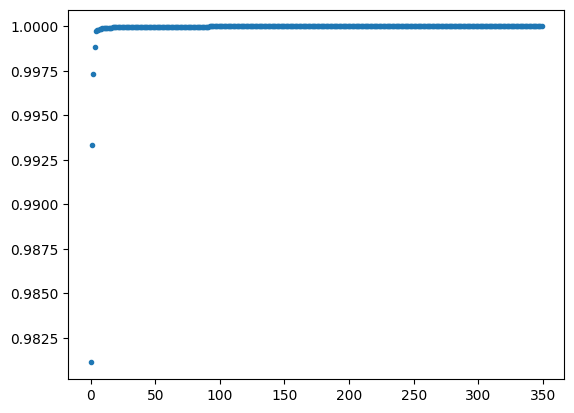

In [41]:
# make plot of cum var vs n components, use matplotlib, lets do the full svd
import matplotlib.pyplot as plt

# do svd on deduplicated activations
# Standardize the data (zero mean and unit variance) before SVD
deduplicated_activations_standardized = (deduplicated_activations - torch.mean(deduplicated_activations, dim=0))
u, s, v = torch.svd(deduplicated_activations_standardized)

# plot the cumulative explained variance
plt.plot(np.cumsum(s**2 / torch.sum(s**2)), '.')
plt.show()



In [32]:
torch.mean(deduplicated_beliefs, axis=0)

tensor([0.2910, 0.1598, 0.1598, 0.1947, 0.1947])

In [36]:
import numpy as np
import torch # Keep torch for mean subtraction if tensors are involved
from sklearn.metrics.pairwise import cosine_similarity

# Assuming deduplicated_beliefs and deduplicated_activations are NumPy arrays or PyTorch tensors
# Convert to numpy if they are tensors before passing to cosine_similarity
if isinstance(deduplicated_beliefs, torch.Tensor):
    deduplicated_beliefs_np = deduplicated_beliefs.cpu().numpy()
    deduplicated_activations_np = deduplicated_activations.cpu().numpy()
    # Calculate mean using torch on the original tensor for potential GPU usage
    mean_beliefs = torch.mean(deduplicated_beliefs, axis=0).cpu().numpy()
    mean_activations = torch.mean(deduplicated_activations, axis=0).cpu().numpy()
else:
    # Assuming they are already NumPy arrays
    deduplicated_beliefs_np = deduplicated_beliefs
    deduplicated_activations_np = deduplicated_activations
    mean_beliefs = np.mean(deduplicated_beliefs_np, axis=0)
    mean_activations = np.mean(deduplicated_activations_np, axis=0)

# --- Center the data (using NumPy arrays) ---
deduplicated_beliefs_centered_np = deduplicated_beliefs_np - mean_beliefs
deduplicated_activations_centered_np = deduplicated_activations_np - mean_activations

# --- Calculate Cosine Similarity ---
# This computes the similarity matrix (cos(theta))
similarity_matrix_beliefs = cosine_similarity(deduplicated_beliefs_centered_np)
similarity_matrix_activations = cosine_similarity(deduplicated_activations_centered_np)

# --- Calculate Angle (in Radians) using Arccosine ---
# Clamp values to [-1, 1] to avoid domain errors with arccos due to potential floating point inaccuracies
similarity_matrix_beliefs_clamped = np.clip(similarity_matrix_beliefs, -1.0, 1.0)
similarity_matrix_activations_clamped = np.clip(similarity_matrix_activations, -1.0, 1.0)

angle_beliefs_rad = np.arccos(similarity_matrix_beliefs_clamped)
angle_activations_rad = np.arccos(similarity_matrix_activations_clamped)

# --- Optional: Convert to Degrees ---
# angle_beliefs_deg = np.degrees(angle_beliefs_rad)
# angle_activations_deg = np.degrees(angle_activations_rad)

# --- Output Example (Angles in Radians) ---
# print("Pairwise angles for beliefs (radians):\n", angle_beliefs_rad)
# print("\nPairwise angles for activations (radians):\n", angle_activations_rad)

# If you need these for the scatter plot later, use angle_beliefs_rad and angle_activations_rad

In [37]:
import numpy as np
import plotly.graph_objects as go

# --- Assuming you have run the previous code block ---
# You should have these variables:
# angle_beliefs_rad (matrix of pairwise belief angles in radians)
# angle_activations_rad (matrix of pairwise activation angles in radians)

# --- Extract upper triangle values (excluding diagonal) ---
# Get indices for the upper triangle (k=1 means exclude the main diagonal)
upper_triangle_indices = np.triu_indices_from(angle_beliefs_rad, k=1)

# Extract the angles using these indices
belief_angles_upper = angle_beliefs_rad[upper_triangle_indices]
activation_angles_upper = angle_activations_rad[upper_triangle_indices]

# --- Create the scatter plot ---
fig_angle_scatter = go.Figure()

fig_angle_scatter.add_trace(go.Scatter(
    x=belief_angles_upper,  # Belief angles on X-axis
    y=activation_angles_upper, # Activation angles on Y-axis
    mode='markers',
    marker=dict(
        size=5,
        opacity=0.6,
        # Optional: Color based on one of the angles
        # color=belief_angles_upper, 
        # colorscale='Viridis', 
        # showscale=True,
        # colorbar_title="Belief Angle (rad)"
    ),
    name='Pairwise Angles'
))

# Add a line y=x for reference
# Calculate range based on radians (0 to pi) or degrees (0 to 180)
# Assuming radians for now:
min_val_rad = 0 # Angle can't be less than 0
max_val_rad = max(np.max(belief_angles_upper), np.max(activation_angles_upper))
# Extend range slightly for plotting
plot_max = min(max_val_rad * 1.05, np.pi) # Don't exceed pi

fig_angle_scatter.add_trace(go.Scatter(
    x=[min_val_rad, plot_max],
    y=[min_val_rad, plot_max],
    mode='lines',
    line=dict(color='red', dash='dash'),
    name='y=x'
))


fig_angle_scatter.update_layout(
    title='Pairwise Angle: Beliefs vs. Activations',
    xaxis_title='Angle between Belief Pairs (Radians)',
    yaxis_title='Angle between Activation Pairs (Radians)',
    width=700,
    height=600,
    # Optional: Set axis ranges if needed (e.g., 0 to pi for radians)
    xaxis_range=[min_val_rad, plot_max],
    yaxis_range=[min_val_rad, plot_max],
    # Optional: Make axes square
    yaxis_scaleanchor="x", 
    yaxis_scaleratio=1,
)

fig_angle_scatter.show()